# NYC Film Permits — a ZIP-code layered map

The Film Office issues permits to productions filming on location in New York City, and provides free police assistance, free parking privileges, and access to most exterior locations free of charge. Sections 9-01 and 9-02 of the film permit rules explain when a permit is necessary.

Generally, permits are not required for casual photographers, tourists, or credentialed members of the media. Productions with equipment packages, production vehicles requesting parking privileges (excluding personal cars, mini-vans, SUVs, and pick-up trucks), asserting exclusive use of City property, prop weapons, prop vehicles, actors in police uniform, or stunts on set, or that require NYPD or FDNY assistance, must apply for a film permit. Insurance is required. "Equipment" is defined as anything more than a hand-held camera, camera on tripod, or hand-held items (bounce-boards, boom mics, etc.).

Each record in this dataset is one approved permit, labeled with an activity type: **Load in/out** (vehicles parking to load sets/equipment into a location), **Shooting** (filming scheduled to occur), **DCAS Prep/Shoot/Wrap** (activity on Department of Citywide Administrative Services property, e.g. a city courthouse), and **Rigging** (set-dressing activity at a location, not filming yet).

**Goal:** build a ZIP-code-level map of NYC filming activity with several stacked attributes — number of permits, average permit duration, and permit category — rather than a single one-off choropleth. Along the way I explore the data's metadata, clean up a few data-quality problems I found, and note what each attribute can and can't tell us.

## 1. Imports

- **geopandas**: core GIS library — lets us treat ZIP-code boundaries as a normal dataframe with a `geometry` column
- **pandas / numpy**: general data wrangling
- **matplotlib**: static plotting (bar charts, histograms, choropleths)
- **palettable**: nicer, colorblind-considered color ramps than matplotlib's defaults
- **lonboard**: interactive, GPU-rendered map widget — used at the end for a 3D multi-attribute view

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LogNorm, LinearSegmentedColormap
from matplotlib.cm import ScalarMappable
from matplotlib_scalebar.scalebar import ScaleBar

from palettable.colorbrewer.sequential import OrRd_9, PuBu_9, Blues_9

from lonboard import Map, PolygonLayer, ScatterplotLayer
from lonboard.colormap import apply_continuous_cmap

pd.set_option("display.max_columns", None)

## 2. Load the data

Two files:
- `Film_Permits_20260708.csv` — one row per approved film permit (NYC Mayor's Office of Media & Entertainment)
- `NYC_Zip_Code_Tabulation_Areas_(MODZCTA)_20260710.geojson` — ZIP-code-ish boundary polygons for NYC (Modified ZCTAs — see note below for more detail)

In [2]:
permit_data = pd.read_csv("./data/Film_Permits_20260708.csv")
zip_shapes = gpd.read_file(
    "./data/NYC_Zip_Code_Tabulation_Areas_(MODZCTA)_20260710.geojson"
)

permit_data.head()

,EventID,EventType,StartDateTime,EndDateTime,EnteredOn,EventAgency,ParkingHeld,Borough,CommunityBoard(s),PolicePrecinct(s),Category,SubCategoryName,Country,ZipCode(s)
0,932520,Shooting Permit,04/06/2026 06:30:00 AM,04/14/2026 09:00:00 PM,04/09/2026 10:21:34 AM,Mayor's Office of Media & Entertainment,MYRTLE AVENUE between FREEDOM DRIVE and PARK L...,Queens,"82, 9,","102,",Television,Episodic series,United States of America,"11385, 11418,"
1,931384,Theater Load in and Load Outs,04/07/2026 12:01:00 PM,04/10/2026 11:59:00 PM,04/05/2026 01:44:46 PM,Mayor's Office of Media & Entertainment,7 AVENUE between WEST 57 STREET and WEST 5...,Manhattan,"5,","18,",Theater,Theater,United States of America,"10019, 10106,"
2,931197,Shooting Permit,04/07/2026 06:37:00 AM,04/07/2026 11:37:00 PM,04/03/2026 06:38:50 PM,Mayor's Office of Media & Entertainment,WEST 24 STREET between 11 AVENUE and 10 AVENUE,Manhattan,"4,","10,",Documentary,Not Applicable,United States of America,"10011,"
3,931181,Shooting Permit,04/06/2026 06:14:00 AM,04/06/2026 08:14:00 PM,04/03/2026 05:16:55 PM,Mayor's Office of Media & Entertainment,WEST 24 STREET between 11 AVENUE and 10 AVENUE,Manhattan,"4,","10,",Documentary,Not Applicable,United States of America,"10011,"
4,931056,DCAS Prep/Shoot/Wrap Permit,04/07/2026 09:30:00 AM,04/07/2026 01:00:00 PM,04/03/2026 11:12:59 AM,Mayor's Office of Media & Entertainment,LAFAYETTE STREET between WORTH STREET and DUAN...,Manhattan,"1,","1, 5,",Television,Episodic series,United States of America,"10007, 10013, 10278,"


In [3]:
print(permit_data.shape)
permit_data.info()

(17881, 14)
<class 'pandas.DataFrame'>
RangeIndex: 17881 entries, 0 to 17880
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   EventID            17881 non-null  int64
 1   EventType          17881 non-null  str  
 2   StartDateTime      17536 non-null  str  
 3   EndDateTime        17721 non-null  str  
 4   EnteredOn          15964 non-null  str  
 5   EventAgency        17881 non-null  str  
 6   ParkingHeld        17881 non-null  str  
 7   Borough            17881 non-null  str  
 8   CommunityBoard(s)  17870 non-null  str  
 9   PolicePrecinct(s)  17870 non-null  str  
 10  Category           17881 non-null  str  
 11  SubCategoryName    17881 non-null  str  
 12  Country            17881 non-null  str  
 13  ZipCode(s)         17870 non-null  str  
dtypes: int64(1), str(13)
memory usage: 8.3 MB


**Metadata scan.** The dataset has 14 columns and ~17,900 rows. Key fields: `EventID` (unique permit id), `EventType` (load-in/out, shooting, rigging, etc.), `StartDateTime`/`EndDateTime`, `Borough`, `Category` (Television, Film, Theater, Commercial, Still Photography, WEB, Documentary, Student, Music Video), `SubCategoryName`, and `ZipCode(s)` that is a **comma-separated string** of every ZIP code the permit touches, since a single shoot can span several blocks or streets.

There's no numeric field to plot directly. Every interesting here is categorical or a timestamp, so I have to derive numeric attributes myself. For this assignment I focus on three derived attributes, all aggregated to ZIP code:

1. **Number of permits** per ZIP — a measure of how much filming activity a neighborhood sees
2. **Average permit duration** (hours) per ZIP — how long a location is tied up, not just how often
3. **Dominant permit category** per ZIP — what *kind* of production is most common there

These three together tell a more complete story than when they exist alone: a ZIP could have few permits that each run for weeks (e.g. a soundstage-heavy area), or many permits that are each just a few hours (e.g. a busy street corner used for one-off b-roll).

## 3. Category — exploring and cleaning

In [4]:
permit_data["Category"].value_counts()

Category
Television              7603
Theater                 3458
Film                    2535
Commercial              1996
Still Photography       1086
WEB                      870
Documentary              154
Student                  112
Music Video               66
3/27/2026 3:29:48 PM       1
Name: count, dtype: int64

The very first red flag: one "category" value is `3/27/2026 3:29:48 PM` — which is a timestamp. Looking closely at that row, several fields are shifted by one column, into `Borough`, `Category`, etc. and all of them hold the wrong values for that record. I ended up have to drop that section of data, which is 1 row out of ~17,900 records, instead I keep the known nine categories, and leave a flag for data-quality note.

In [5]:
known_categories = {
    "Television",
    "Theater",
    "Film",
    "Commercial",
    "Still Photography",
    "WEB",
    "Documentary",
    "Student",
    "Music Video",
}

n_before = len(permit_data)
permit_data = permit_data[permit_data["Category"].isin(known_categories)].copy()
print(
    f"Dropped {n_before - len(permit_data)} malformed row(s); {len(permit_data)} remain."
)

Dropped 1 malformed row(s); 17880 remain.


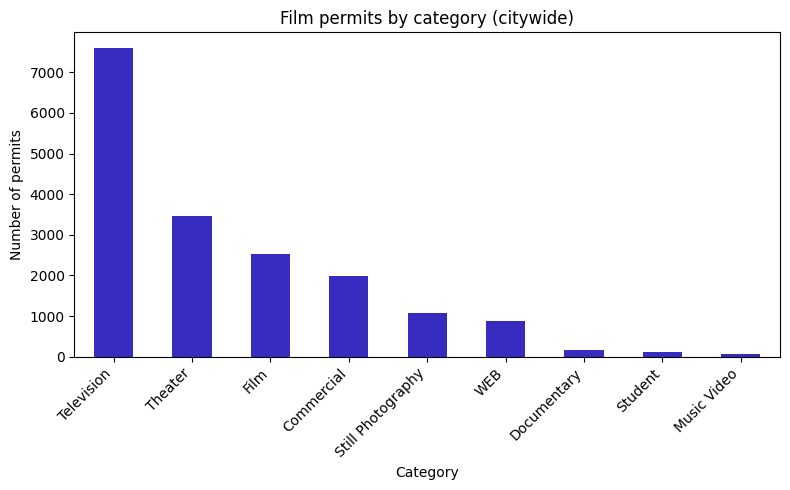

In [6]:
permit_data["Category"].value_counts().plot(kind="bar", figsize=(8, 5), color="#372bc0")
plt.title("Film permits by category (citywide)")
plt.ylabel("Number of permits")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

Television dominates citywide (over 40% of permits), followed by Theater and Film. Commercial, Still Photography, and WEB make up most of the rest. This tells us the relative frequency of production types, but information about crew size, budget, or how disruptive each shoot is still missing. A single Television episodic permit could involve a much bigger footprint than ten Still Photography permits combined.

## 4. Duration — exploring and cleaning

In [7]:
permit_data["StartDateTime"] = pd.to_datetime(
    permit_data["StartDateTime"], format="%m/%d/%Y %I:%M:%S %p", errors="coerce"
)
permit_data["EndDateTime"] = pd.to_datetime(
    permit_data["EndDateTime"], format="%m/%d/%Y %I:%M:%S %p", errors="coerce"
)

permit_data["duration_hours"] = (
    permit_data["EndDateTime"] - permit_data["StartDateTime"]
).dt.total_seconds() / 3600

permit_data["duration_hours"].describe()

count    17377.000000
mean        22.183189
std         45.831417
min         -6.033333
25%         13.000000
50%         15.000000
75%         17.000000
max       1667.983333
Name: duration_hours, dtype: float64

Second Redflag: two data-quality issues show up in `.describe()`:

- A **negative minimum** — some permits have an end time before the start time (likely a data-entry error, e.g. AM/PM mixed up). These would visually break a histogram and skew a ZIP-level average, which is irrelevant for here.
- A **very large maximum** (~1,668 hours ≈ 70 days) — this is plausible (a long-running production holding a location for weeks) rather than obviously wrong, so I decided to keep it, but it means the *mean* duration per ZIP can be pulled upward by a handful of very long permits.

Dropped 520 row(s) with non-positive duration; 17360 remain.


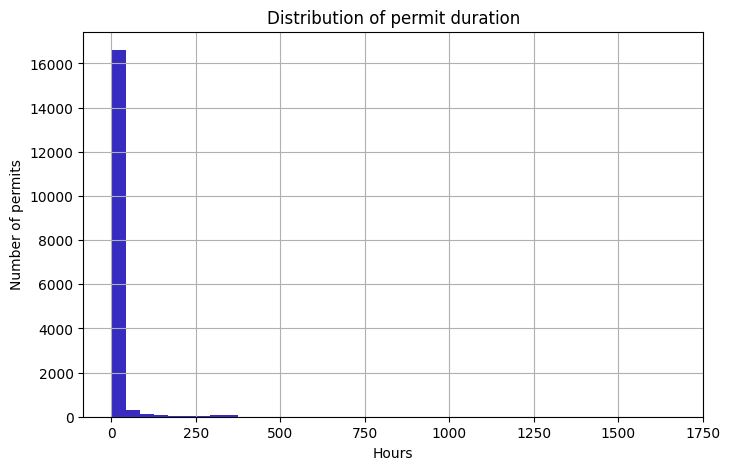

In [8]:
n_before = len(permit_data)
permit_data = permit_data[permit_data["duration_hours"] > 0]
print(
    f"Dropped {n_before - len(permit_data)} row(s) with non-positive duration; {len(permit_data)} remain."
)

permit_data["duration_hours"].hist(bins=40, figsize=(8, 5), color="#372bc0")
plt.xlabel("Hours")
plt.ylabel("Number of permits")
plt.title("Distribution of permit duration")
plt.show()

Most filming permits are relatively short, while a smaller number extend over much longer periods. Duration indicates how long a location is reserved but does not reflect the number of crew members or production budget.

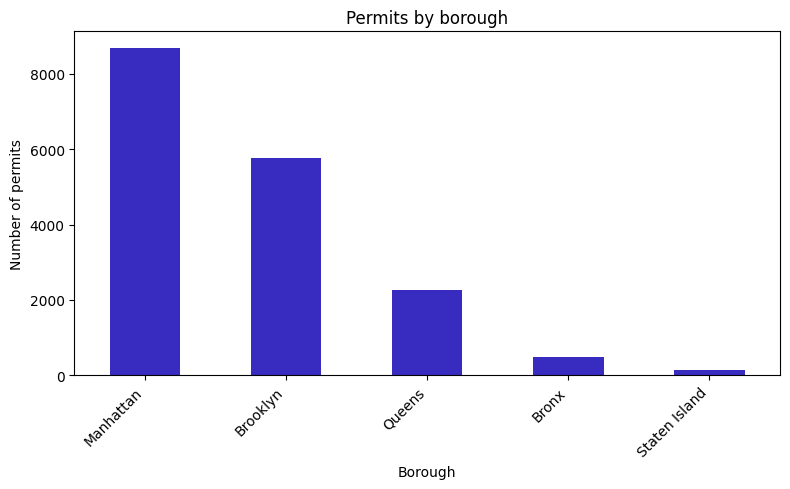

In [9]:
permit_data["Borough"].value_counts().plot.bar(figsize=(8, 5), color="#372bc0")
plt.title("Permits by borough")
plt.ylabel("Number of permits")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

Manhattan and Brooklyn dominate: it is expected, given production infrastructure (soundstages, crew, permit office proximity) is concentrated there. This borough-level view is limited becuase it does not show where within a borough activity clusters.

## 5. Building the ZIP-code layer

`ZipCode(s)` is a single string like `"11385, 11418,"` — a permit can list more than one ZIP if it spans multiple locations. To aggregate correctly, I split on commas and give each permit one row per ZIP it touches (an `explode`). This does mean a multi-ZIP permit gets counted once in *each* ZIP it lists — a real limitation to keep in mind when reading the permit-count map: it counts *permit-ZIP touches*, not unique productions.

In [10]:
zip_df = permit_data.copy()
zip_df["ZipCode(s)"] = zip_df["ZipCode(s)"].fillna("").str.split(",")
zip_df = zip_df.explode("ZipCode(s)")
zip_df["ZipCode(s)"] = zip_df["ZipCode(s)"].str.strip()

# keep only well-formed 5-digit ZIPs
zip_df = zip_df[zip_df["ZipCode(s)"].str.fullmatch(r"\d{5}", na=False)]

print(
    f"{len(zip_df):,} permit-ZIP rows across {zip_df['ZipCode(s)'].nunique()} unique ZIP codes"
)

26,223 permit-ZIP rows across 219 unique ZIP codes


**Why the boundary file is called "Modified" ZCTA (MODZCTA)?** 
Standard ZIP codes include things like single-building ZIPs (e.g. skyscrapers with their own ZIP) and PO-box-only ZIPs that have no meaningful land area. MODZCTA merges these into neighboring ZIPs to make a cleaner set of mappable polygons — so raw ZIP `10118` (the Empire State Building) doesn't have its own polygon; it's folded into `10001`. The boundary file includes a `zcta` field listing every raw ZIP code folded into each MODZCTA polygon, which I use to build a crosswalk instead of merging directly on ZIP code (which would silently drop ~9% of records).
-> information gotten from ChatGPT

In [11]:
zip_shapes[["modzcta", "label", "zcta"]].head()

,modzcta,label,zcta
0,10001,"10001, 10118","10001, 10119, 10199"
1,10002,10002,10002
2,10003,10003,10003
3,10026,10026,10026
4,10004,10004,10004


In [12]:
# crosswalk: every raw ZIP -> the MODZCTA polygon it belongs to
crosswalk = {}
for _, row in zip_shapes.iterrows():
    for raw_zip in str(row["zcta"]).split(","):
        crosswalk[raw_zip.strip()] = row["modzcta"]

zip_df["modzcta"] = zip_df["ZipCode(s)"].map(crosswalk)

n_matched = zip_df["modzcta"].notna().sum()
print(
    f"{n_matched:,} of {len(zip_df):,} permit-ZIP rows ({n_matched/len(zip_df):.1%}) matched to a MODZCTA polygon"
)

zip_df = zip_df.dropna(subset=["modzcta"])

24,840 of 26,223 permit-ZIP rows (94.7%) matched to a MODZCTA polygon


Result: About 94–95% of permit-ZIP rows match. The rest are ZIP codes not present in this MODZCTA vintage at all — a mix of clearly invalid entries (e.g. `00083`), newer/edge-case Brooklyn ZIPs (`11249`, `11251`) not yet folded into this boundary file's crosswalk, and a few out-of-city entries. Those records are simply excluded from the maps below because they can't be placed on this boundary set, which is itself a limitation of the map (it under-represents activity in ZIPs the boundary file doesn't cover).

## 6. Aggregating the three attributes by ZIP

In [13]:
zip_counts = zip_df.groupby("modzcta").size().reset_index(name="permits")

zip_duration = (
    zip_df.groupby("modzcta")["duration_hours"]
    .mean()
    .reset_index(name="avg_duration_hours")
)

zip_categories = (
    zip_df.groupby("modzcta")["Category"].nunique().reset_index(name="n_categories")
)

top_category = (
    zip_df.groupby(["modzcta", "Category"])
    .size()
    .reset_index(name="n")
    .sort_values("n", ascending=False)
    .drop_duplicates("modzcta")
    .rename(columns={"Category": "top_category"})[["modzcta", "top_category"]]
)

zip_summary = (
    zip_counts.merge(zip_duration, on="modzcta")
    .merge(top_category, on="modzcta")
    .merge(zip_categories, on="modzcta")
)

zip_summary.sort_values("permits", ascending=False).head(10)

,modzcta,permits,avg_duration_hours,top_category,n_categories
109,11222,2618,16.716005,Television,8
16,10019,1691,27.805460,Theater,7
82,11101,1376,15.564668,Television,8
32,10036,1014,26.292801,Television,9
0,10001,1000,29.400883,Theater,8
11,10013,947,14.581485,Television,8
19,10023,931,80.297207,Theater,8
2,10003,889,17.763873,Theater,9
89,11201,617,20.200000,Theater,8
9,10011,597,14.749246,Television,9


In [14]:
map_data = zip_shapes.merge(zip_summary, on="modzcta", how="left")
print(
    f"{map_data['permits'].notna().sum()} of {len(map_data)} MODZCTA polygons have at least one matched permit"
)

175 of 178 MODZCTA polygons have at least one matched permit


## 7. Map 1 — Number of permits by ZIP

The most basic layer: how much filming activity has taken in each ZIP? I use a quantile classification (equal number of ZIPs per color bucket) rather than equal-interval, since permit counts are heavily right-skewed (a handful of ZIPs have 1,000+ permits while most have under 50) — equal intervals would put almost everything in the lowest bucket.

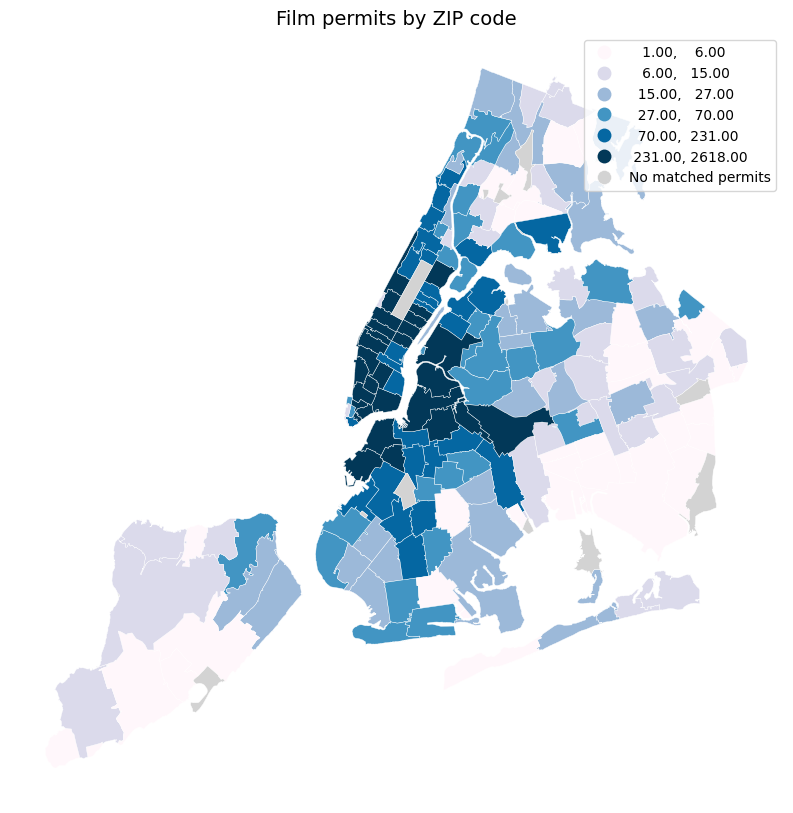

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
map_data.plot(
    column="permits",
    cmap="PuBu",
    scheme="quantiles",
    k=6,
    legend=True,
    edgecolor="white",
    linewidth=0.3,
    ax=ax,
    missing_kwds={"color": "lightgray", "label": "No matched permits"},
)
ax.set_title("Film permits by ZIP code", fontsize=14)
ax.set_axis_off()
plt.show()

**Readable Data:** a handful of ZIPs in Manhattan (Midtown/Hell's Kitchen, Greenwich Village/SoHo) and northern Brooklyn (Greenpoint/Williamsburg) stand out as clear filming hubs.

**Unredable Data:** raw counts aren't normalized by ZIP area or by how much street/sidewalk space the ZIP actually has. A large but permit-dense ZIP looks the same on this map as a tiny one packed with the same number of permits. It also double-counts any permit that lists multiple ZIPs, and it treats a one-hour still-photography permit the same as a three-week television shoot.

## 8. Map 2 — Average permit duration by ZIP

This layer answers a different question than Map 1: not how often is a ZIP used, but how long does each permit typically tie it up?

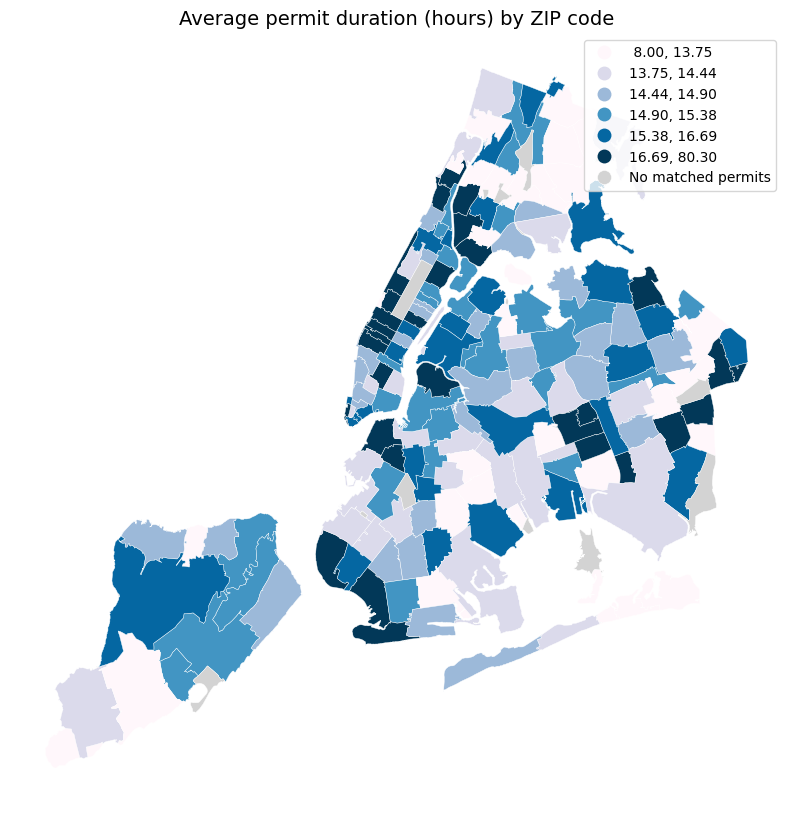

In [16]:
fig, ax = plt.subplots(figsize=(10, 10))
map_data.plot(
    column="avg_duration_hours",
    cmap="PuBu",
    scheme="quantiles",
    k=6,
    legend=True,
    edgecolor="white",
    linewidth=0.3,
    ax=ax,
    missing_kwds={"color": "lightgray", "label": "No matched permits"},
)
ax.set_title("Average permit duration (hours) by ZIP code", fontsize=14)
ax.set_axis_off()
plt.show()

**Readable Data:** some ZIPs with relatively few permits (Map 1) actually show up here with high average durations. Those are places where filming is less frequent but more disruptive per occurrence when it happens.

**Unreadable Data:** because I used the mean, a ZIP with only 2–3 permits where one happens to be a multi-week shoot will show a high average that isn't representative of a "typical" permit there. The earlier histogram showed duration is right-skewed, so this map is more reliable in ZIPs with many permits (where the mean is less sensitive to one outlier) than in sparse ones. A median-duration version would be a good sanity check but isn't shown here.

## 9. Map 3 — Dominant permit category by ZIP

A categorical layer: for each ZIP, which production category accounts for the most permits?

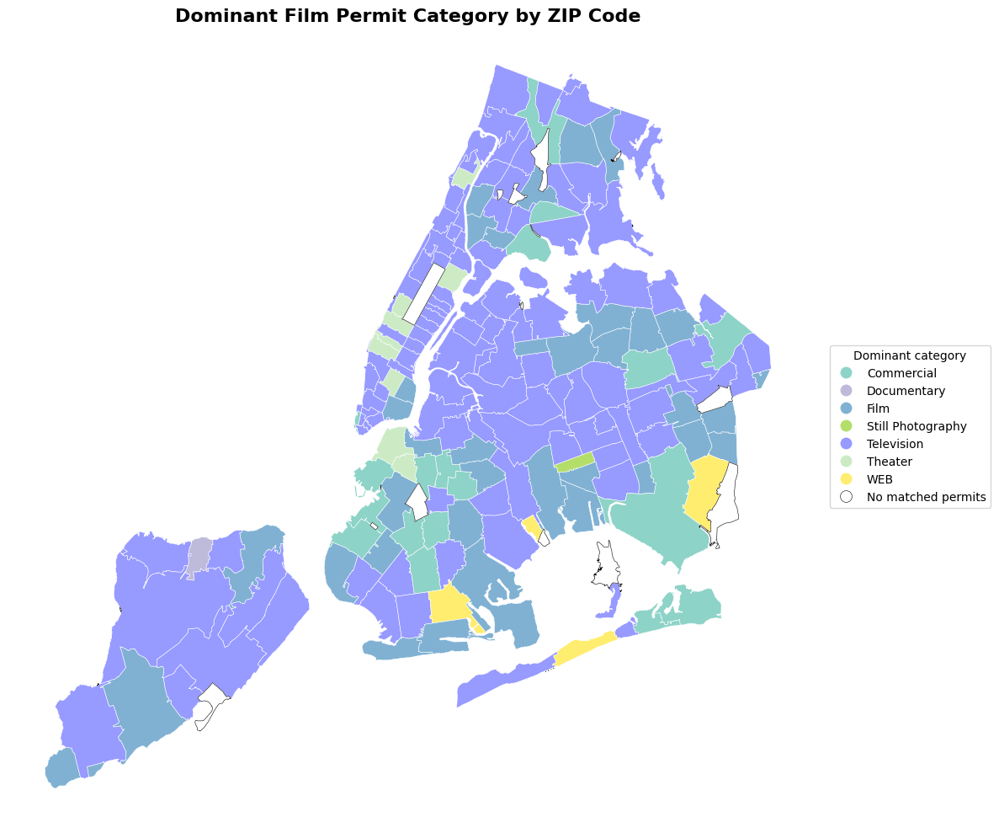

In [17]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

colors = list(plt.get_cmap("Set3").colors)

# Replace the gray-ish Set3 color
colors[8] = "#979AFF"

custom_cmap = mcolors.ListedColormap(colors)

fig, ax = plt.subplots(figsize=(12, 10))

map_data.plot(
    column="top_category",
    categorical=True,
    cmap=custom_cmap,
    legend=True,
    edgecolor="white",
    linewidth=0.4,
    ax=ax,
    missing_kwds={
        "color": "white",
        "edgecolor": "black",
        "label": "No matched permits",
    },
    legend_kwds={
        "loc": "center left",
        "bbox_to_anchor": (1.02, 0.5),
        "title": "Dominant category",
    },
)

ax.set_title(
    "Dominant Film Permit Category by ZIP Code", fontsize=16, fontweight="bold"
)
ax.set_axis_off()

plt.tight_layout()
plt.show()

**Readable Data:** Television and Theater dominate most ZIPs, but there are visible pockets - e.g. Theater is the top category in the Theater District ZIPs, unsurprisingly, while Television leads in the Greenpoint/Long Island City soundstage corridor.

**Unreadable Data:** "dominant" hides everything else. A ZIP that's 51% Television and 49% Film reads identically on this map to one that's 95% Television. The `n_categories` column I computed alongside this (how many distinct categories appear at all in a ZIP) is a quick way to check for that.

In [18]:
map_data[["modzcta", "permits", "top_category", "n_categories"]].sort_values(
    "n_categories", ascending=False
).head(10)

,modzcta,permits,top_category,n_categories
1,10002,549.0,Film,9.0
2,10003,889.0,Theater,9.0
5,10005,263.0,Television,9.0
10,10011,597.0,Television,9.0
33,10036,1014.0,Television,9.0
24,10027,223.0,Television,9.0
16,10018,315.0,Theater,9.0
93,11206,253.0,Television,9.0
118,11231,330.0,Commercial,9.0
103,11215,126.0,Film,9.0


ZIPs with high permit counts unsurprisingly also tend to have high category diversity (more activity, more chances to see every category) but it's worth checking rather than assuming, since a ZIP could in principle have 500 permits that are all Television.

## 10. A closer look — category-specific hot spots

The dominant-category map (Map 3) visualizes ZIP area according to each Permit types.

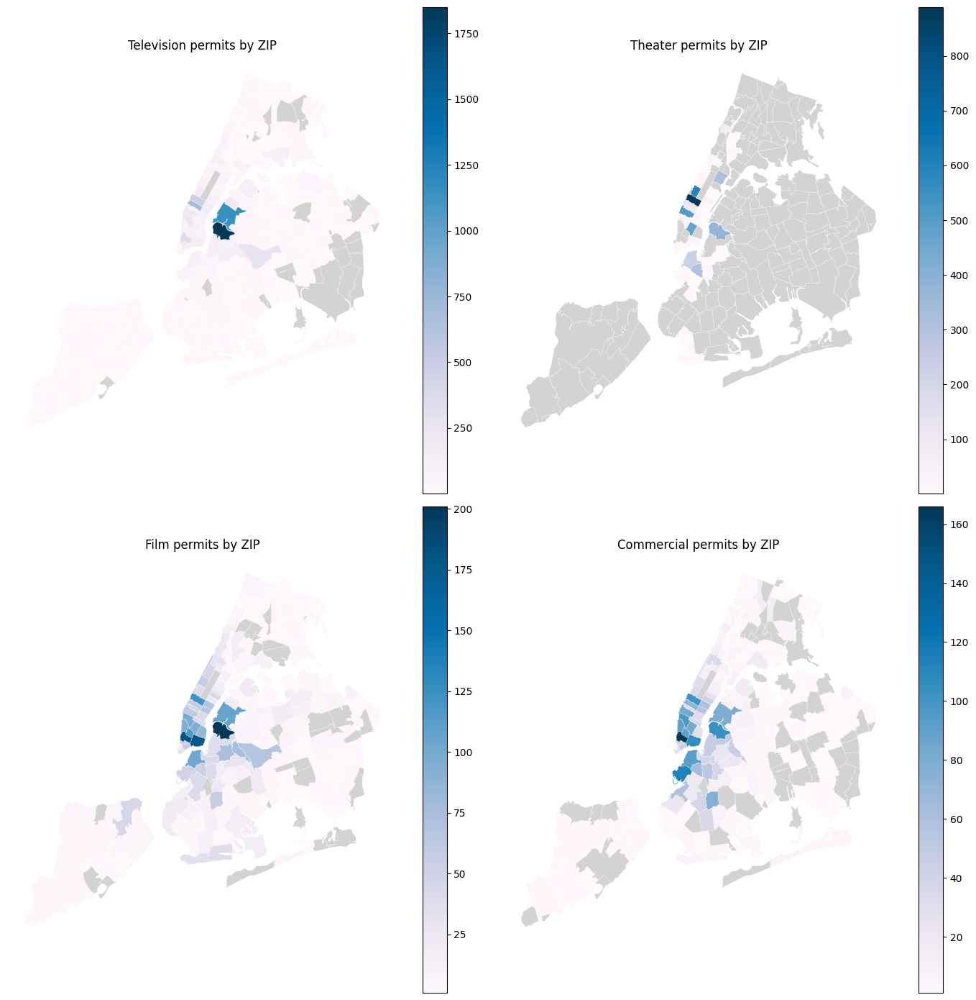

In [19]:
top4 = permit_data["Category"].value_counts().head(4).index.tolist()

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
for ax, cat in zip(axes.flat, top4):
    sub = (
        zip_df[zip_df["Category"] == cat]
        .groupby("modzcta")
        .size()
        .reset_index(name="n")
    )
    md_cat = zip_shapes.merge(sub, on="modzcta", how="left")
    md_cat.plot(
        column="n",
        cmap="PuBu",
        legend=True,
        edgecolor="white",
        linewidth=0.2,
        ax=ax,
        missing_kwds={"color": "lightgray"},
    )
    ax.set_title(f"{cat} permits by ZIP")
    ax.set_axis_off()
plt.tight_layout()
plt.show()

Each subplot uses its own color scale (not shared), so these maps show where each category concentrates, not how categories compare to each other in raw volume — Television's map and Commercial's map can't be compared color-to-color, only shape-to-shape.

## 11. Combining layers — an interactive 3D map

Static choropleths can only really show one attribute clearly at a time (or a hidden second one via a categorical color scheme). `lonboard` lets me combine two attributes into a single interactive map: **permit count as building height (elevation)** and **average duration as color**. Drag/zoom/rotate to explore.

In [20]:
layer_data = map_data.dropna(subset=["permits", "avg_duration_hours"]).copy()

elevation = layer_data["permits"].to_numpy()
elevation_scaled = elevation / elevation.max() * 3000  # scale for visibility

duration = layer_data["avg_duration_hours"].to_numpy()
normalizer = LogNorm(duration.min() + 1, duration.max(), clip=True)
colors = apply_continuous_cmap(normalizer(duration), PuBu_9)

layer = PolygonLayer.from_geopandas(
    gdf=layer_data[
        ["modzcta", "permits", "avg_duration_hours", "top_category", "geometry"]
    ],
    extruded=True,
    get_elevation=elevation_scaled,
    get_fill_color=colors,
    wireframe=True,
    opacity=0.8,
)

view_state = {
    "longitude": -73.9776,
    "latitude": 40.7614,
    "zoom": 10.3,
    "pitch": 55,
    "bearing": 0,
}

m = Map(layer, view_state=view_state)
m

**Reading this map:** tall towers are high-permit-count ZIPs; color (light → dark orange) shows average duration. A tall, dark tower is a ZIP that's both heavily used and tends to have long-running permits.

## 12. Goal - Cartography of Film Permit Information
Here, I tried to get help from AI to visualize several layers of information extracted from the data into a single interactive map.
Three datas are this:
- Number of permits by ZIP as extrusion height(elevation)
- Average Permit Duration by ZIP as color scheme
- Dominant Permit Category by ZIP as colored dot wih separate color legend

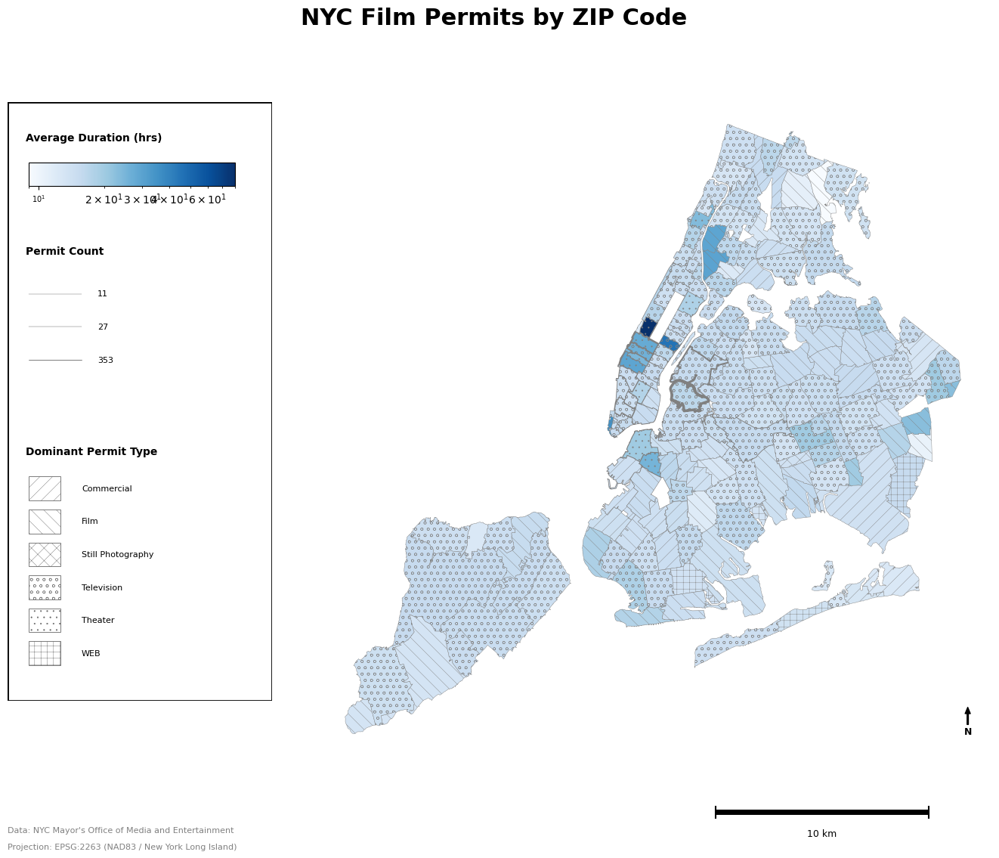

In [21]:
pd.set_option("display.max_columns", None)

layer_data3 = map_data.dropna(
    subset=["permits", "avg_duration_hours", "top_category"]
).copy()

plt.rcParams["hatch.linewidth"] = 0.3

# Project to NY State Plane (EPSG:2263)

gdf_proj = layer_data3.to_crs(2263)

# Channel 1 : Fill color

duration = gdf_proj["avg_duration_hours"].to_numpy()

duration_normalizer = LogNorm(
    duration.min() + 1,
    duration.max(),
    clip=True,
)

duration_cmap = Blues_9.mpl_colormap

# Channel 2 : Boundary width

permits = gdf_proj["permits"].to_numpy()

min_lw = 0.3
max_lw = 2.5

# Channel 3 : Hatch pattern

category_hatches = {
    "Commercial": "//",
    "Film": "\\\\",
    "Still Photography": "xx",
    "Television": "oo",
    "Theater": "..",
    "WEB": "++",
}

# Figure

fig = plt.figure(figsize=(14, 12))
fig.patch.set_facecolor("white")

# MAP

# left, bottom, width, height
ax = fig.add_axes([0.33, 0.12, 0.64, 0.76])

ax.set_facecolor("white")

for _, row in gdf_proj.iterrows():

    color = duration_cmap(duration_normalizer(row["avg_duration_hours"]))

    lw = min_lw + (row["permits"] / permits.max()) * (max_lw - min_lw)

    hatch = category_hatches.get(row["top_category"], "")

    gpd.GeoSeries(
        [row.geometry],
        crs=gdf_proj.crs,
    ).plot(
        ax=ax,
        facecolor=color,
        edgecolor="#808080",
        linewidth=lw,
        hatch=hatch,
        zorder=2,
    )

ax.set_axis_off()
ax.set_aspect("equal")

# TITLE

fig.suptitle(
    "NYC Film Permits by ZIP Code",
    fontsize=22,
    fontweight="bold",
    y=0.965,
)

# LEGEND

legend_ax = fig.add_axes([0.04, 0.20, 0.25, 0.66])

legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.axis("off")

legend_ax.add_patch(
    mpatches.Rectangle(
        (0, 0),
        1,
        1,
        transform=legend_ax.transAxes,
        facecolor="white",
        edgecolor="black",
        linewidth=2,
    )
)

section_gap = 0.09
item_gap = 0.055

y = 0.95

# Average Duration

legend_ax.text(
    0.07,
    y,
    "Average Duration (hrs)",
    fontsize=10,
    fontweight="bold",
    va="top",
)

cbar_ax = legend_ax.inset_axes([0.08, 0.86, 0.78, 0.04])

sm = ScalarMappable(
    norm=duration_normalizer,
    cmap=duration_cmap,
)

cbar = plt.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal",
)

cbar.ax.tick_params(labelsize=7)

y = 0.76

# Permit Count

legend_ax.text(
    0.07,
    y,
    "Permit Count",
    fontsize=10,
    fontweight="bold",
    va="top",
)

y -= 0.08

count_breaks = np.percentile(permits, [25, 50, 90]).astype(int)

lw_breaks = min_lw + (count_breaks / permits.max()) * (max_lw - min_lw)

for value, lw in zip(count_breaks, lw_breaks):

    legend_ax.plot(
        [0.08, 0.28],
        [y, y],
        color="#666666",
        linewidth=lw,
        solid_capstyle="round",
    )

    legend_ax.text(
        0.34,
        y,
        f"{value:,}",
        fontsize=8,
        va="center",
    )

    y -= item_gap
# spacing before next section

y -= section_gap

# Dominant Permit Type

legend_ax.text(
    0.07,
    y,
    "Dominant Permit Type",
    fontsize=10,
    fontweight="bold",
    va="top",
)

y -= 0.07

for category, hatch in category_hatches.items():

    legend_ax.add_patch(
        mpatches.Rectangle(
            (0.08, y - 0.02),
            0.12,
            0.04,
            facecolor="white",
            edgecolor="#666666",
            linewidth=0.6,
            hatch=hatch,
        )
    )

    legend_ax.text(
        0.28,
        y,
        category,
        fontsize=8,
        va="center",
    )

    y -= item_gap

# NORTH ARROW

ax.annotate(
    "N",
    xy=(0.965, 0.085),
    xytext=(0.965, 0.045),
    xycoords="axes fraction",
    textcoords="axes fraction",
    ha="center",
    fontsize=9,
    fontweight="bold",
    arrowprops=dict(
        facecolor="black",
        edgecolor="black",
        width=1.2,
        headwidth=5,
        headlength=6,
        shrink=0,
    ),
)

# SCALE BAR

scale_ax = fig.add_axes([0.69, 0.05, 0.24, 0.05])

scale_ax.set_xlim(0, 1)
scale_ax.set_ylim(0, 1)
scale_ax.axis("off")

# main line
scale_ax.plot(
    [0.08, 0.92],
    [0.55, 0.55],
    color="black",
    linewidth=5,
    solid_capstyle="butt",
)

# end ticks
scale_ax.plot(
    [0.08, 0.08],
    [0.42, 0.68],
    color="black",
    linewidth=1.5,
)

scale_ax.plot(
    [0.92, 0.92],
    [0.42, 0.68],
    color="black",
    linewidth=1.5,
)

scale_ax.text(
    0.50,
    0.02,
    "10 km",
    ha="center",
    fontsize=9,
)

# FOOTER

fig.text(
    0.04,
    0.055,
    "Data: NYC Mayor's Office of Media and Entertainment",
    fontsize=8,
    color="gray",
)

fig.text(
    0.04,
    0.037,
    "Projection: EPSG:2263 (NAD83 / New York Long Island)",
    fontsize=8,
    color="gray",
)

# SAVE

plt.savefig(
    "nyc_permits_map.png",
    dpi=300,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

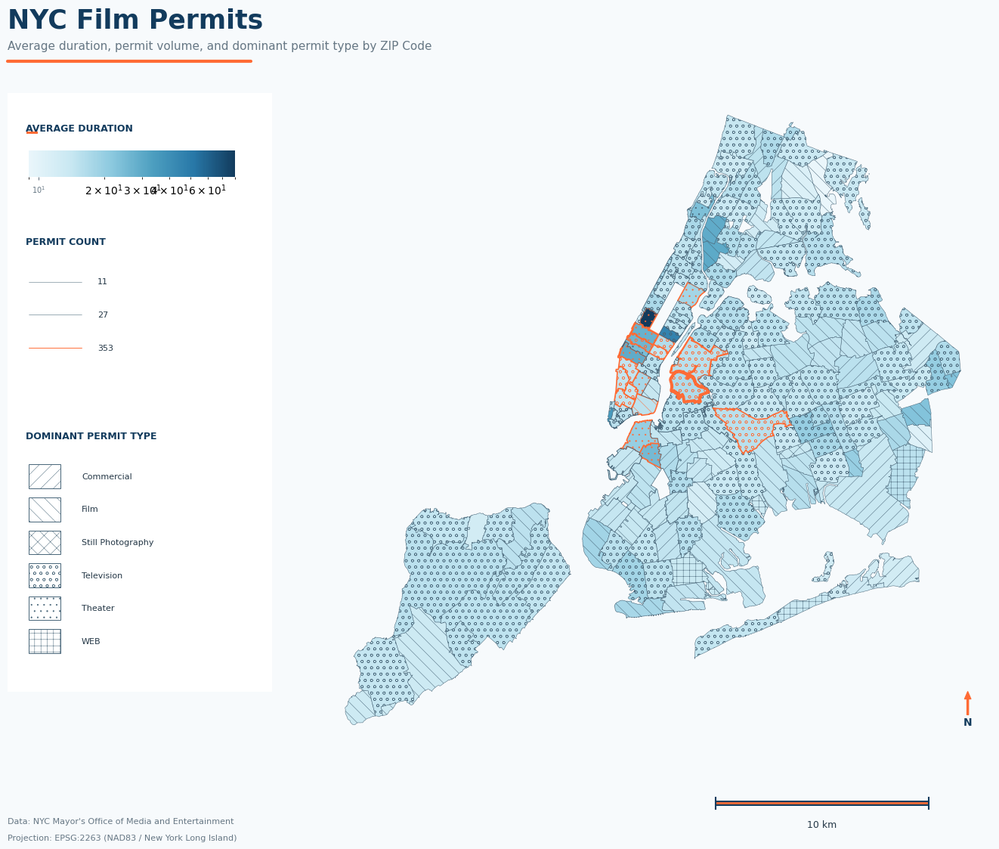

In [22]:
# ============================================================
# SETTINGS
# ============================================================

pd.set_option("display.max_columns", None)

# Color palette
BLUE_DARK = "#123B5D"
BLUE_MID = "#2878A8"
BLUE_LIGHT = "#DCEFF7"

ORANGE = "#FF6B35"
ORANGE_LIGHT = "#FFE2D7"

TEXT = "#243746"
TEXT_LIGHT = "#667784"
BORDER = "#C8D5DD"
HATCH_COLOR = "#466477"
BACKGROUND = "#F7FAFC"


# ============================================================
# DATA
# ============================================================

layer_data3 = map_data.dropna(
    subset=["permits", "avg_duration_hours", "top_category"]
).copy()

plt.rcParams["hatch.linewidth"] = 0.35

# Project to NY State Plane
gdf_proj = layer_data3.to_crs(2263)


# ============================================================
# CHANNEL 1 — FILL COLOR
# ============================================================

duration = gdf_proj["avg_duration_hours"].to_numpy()

duration_normalizer = LogNorm(
    duration.min() + 1,
    duration.max(),
    clip=True,
)

# Custom blue palette
duration_cmap = LinearSegmentedColormap.from_list(
    "custom_blues",
    [
        "#EAF6FB",
        "#C9E8F2",
        "#8CC9DF",
        "#4D9FC0",
        "#2878A8",
        "#123B5D",
    ],
)


# ============================================================
# CHANNEL 2 — BOUNDARY WIDTH
# ============================================================

permits = gdf_proj["permits"].to_numpy()

min_lw = 0.35
max_lw = 2.8


# ============================================================
# CHANNEL 3 — HATCH PATTERN
# ============================================================

category_hatches = {
    "Commercial": "//",
    "Film": "\\\\",
    "Still Photography": "xx",
    "Television": "oo",
    "Theater": "..",
    "WEB": "++",
}


# ============================================================
# FIGURE
# ============================================================

fig = plt.figure(figsize=(14, 12))
fig.patch.set_facecolor(BACKGROUND)


# ============================================================
# MAP
# ============================================================

ax = fig.add_axes([0.33, 0.12, 0.64, 0.76])

ax.set_facecolor(BACKGROUND)


# Calculate permit threshold for orange highlighting
permit_highlight_threshold = np.percentile(permits, 90)


for _, row in gdf_proj.iterrows():

    # Fill color = average duration
    color = duration_cmap(duration_normalizer(row["avg_duration_hours"]))

    # Boundary width = permit count
    lw = min_lw + (row["permits"] / permits.max()) * (max_lw - min_lw)

    # Hatch = dominant permit category
    hatch = category_hatches.get(
        row["top_category"],
        "",
    )

    # Orange highlight for exceptionally high permit counts
    if row["permits"] >= permit_highlight_threshold:
        edge_color = ORANGE
        edge_lw = max(lw, 1.2)
    else:
        edge_color = HATCH_COLOR
        edge_lw = lw

    gpd.GeoSeries(
        [row.geometry],
        crs=gdf_proj.crs,
    ).plot(
        ax=ax,
        facecolor=color,
        edgecolor=edge_color,
        linewidth=edge_lw,
        hatch=hatch,
        zorder=2,
    )


ax.set_axis_off()
ax.set_aspect("equal")


# ============================================================
# TITLE
# ============================================================

fig.text(
    0.04,
    0.955,
    "NYC Film Permits",
    fontsize=25,
    fontweight="bold",
    color=BLUE_DARK,
    va="top",
)

fig.text(
    0.04,
    0.918,
    "Average duration, permit volume, and dominant permit type by ZIP Code",
    fontsize=11,
    color=TEXT_LIGHT,
    va="top",
)

# Orange accent line
fig.add_artist(
    plt.Line2D(
        [0.04, 0.27],
        [0.895, 0.895],
        transform=fig.transFigure,
        color=ORANGE,
        linewidth=3,
        solid_capstyle="round",
    )
)


# ============================================================
# LEGEND PANEL
# ============================================================

legend_ax = fig.add_axes([0.04, 0.20, 0.25, 0.66])

legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.axis("off")


# Soft panel background
legend_ax.add_patch(
    mpatches.FancyBboxPatch(
        (0, 0),
        1,
        1,
        boxstyle="round,pad=0.012,rounding_size=0.02",
        transform=legend_ax.transAxes,
        facecolor="white",
        edgecolor=BORDER,
        linewidth=1.2,
    )
)


section_gap = 0.085
item_gap = 0.055

y = 0.95


# ============================================================
# LEGEND — AVERAGE DURATION
# ============================================================

legend_ax.text(
    0.07,
    y,
    "AVERAGE DURATION",
    fontsize=9,
    fontweight="bold",
    color=BLUE_DARK,
    va="top",
)

legend_ax.add_patch(
    mpatches.Rectangle(
        (0.07, y - 0.018),
        0.045,
        0.004,
        transform=legend_ax.transAxes,
        facecolor=ORANGE,
        edgecolor="none",
    )
)


cbar_ax = legend_ax.inset_axes([0.08, 0.86, 0.78, 0.045])

sm = ScalarMappable(
    norm=duration_normalizer,
    cmap=duration_cmap,
)

cbar = plt.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal",
)

cbar.outline.set_visible(False)

cbar.ax.tick_params(
    labelsize=7,
    colors=TEXT_LIGHT,
    length=3,
)

y = 0.76


# ============================================================
# LEGEND — PERMIT COUNT
# ============================================================

legend_ax.text(
    0.07,
    y,
    "PERMIT COUNT",
    fontsize=9,
    fontweight="bold",
    color=BLUE_DARK,
    va="top",
)

y -= 0.075

count_breaks = np.percentile(
    permits,
    [25, 50, 90],
).astype(int)

lw_breaks = min_lw + (count_breaks / permits.max()) * (max_lw - min_lw)


for i, (value, lw) in enumerate(zip(count_breaks, lw_breaks)):

    # Highlight highest category with orange
    line_color = ORANGE if i == len(count_breaks) - 1 else HATCH_COLOR

    legend_ax.plot(
        [0.08, 0.28],
        [y, y],
        color=line_color,
        linewidth=lw,
        solid_capstyle="round",
    )

    legend_ax.text(
        0.34,
        y,
        f"{value:,}",
        fontsize=8,
        color=TEXT,
        va="center",
    )

    y -= item_gap


# ============================================================
# LEGEND — DOMINANT PERMIT TYPE
# ============================================================

y -= section_gap

legend_ax.text(
    0.07,
    y,
    "DOMINANT PERMIT TYPE",
    fontsize=9,
    fontweight="bold",
    color=BLUE_DARK,
    va="top",
)

y -= 0.075


for category, hatch in category_hatches.items():

    legend_ax.add_patch(
        mpatches.Rectangle(
            (0.08, y - 0.02),
            0.12,
            0.04,
            facecolor="white",
            edgecolor=HATCH_COLOR,
            linewidth=0.7,
            hatch=hatch,
        )
    )

    legend_ax.text(
        0.28,
        y,
        category,
        fontsize=8,
        color=TEXT,
        va="center",
    )

    y -= item_gap


# ============================================================
# NORTH ARROW
# ============================================================

ax.annotate(
    "N",
    xy=(0.965, 0.095),
    xytext=(0.965, 0.045),
    xycoords="axes fraction",
    textcoords="axes fraction",
    ha="center",
    fontsize=10,
    fontweight="bold",
    color=BLUE_DARK,
    arrowprops=dict(
        facecolor=ORANGE,
        edgecolor=ORANGE,
        width=1.5,
        headwidth=6,
        headlength=7,
        shrink=0,
    ),
)


# ============================================================
# SCALE BAR
# ============================================================

scale_ax = fig.add_axes([0.69, 0.05, 0.24, 0.05])

scale_ax.set_xlim(0, 1)
scale_ax.set_ylim(0, 1)
scale_ax.axis("off")


# Main scale line
scale_ax.plot(
    [0.08, 0.92],
    [0.55, 0.55],
    color=BLUE_DARK,
    linewidth=5,
    solid_capstyle="butt",
)

# Orange center accent
scale_ax.plot(
    [0.08, 0.92],
    [0.55, 0.55],
    color=ORANGE,
    linewidth=2,
    solid_capstyle="butt",
)


# End ticks
for x in [0.08, 0.92]:

    scale_ax.plot(
        [x, x],
        [0.42, 0.68],
        color=BLUE_DARK,
        linewidth=1.5,
    )


scale_ax.text(
    0.50,
    0.02,
    "10 km",
    ha="center",
    fontsize=9,
    color=TEXT,
)


# ============================================================
# FOOTER
# ============================================================

fig.text(
    0.04,
    0.055,
    "Data: NYC Mayor's Office of Media and Entertainment",
    fontsize=8,
    color=TEXT_LIGHT,
)

fig.text(
    0.04,
    0.037,
    "Projection: EPSG:2263 (NAD83 / New York Long Island)",
    fontsize=8,
    color=TEXT_LIGHT,
)


# ============================================================
# SAVE
# ============================================================

plt.savefig(
    "nyc_permits_map.png",
    dpi=300,
    bbox_inches="tight",
    facecolor=BACKGROUND,
)

plt.show()

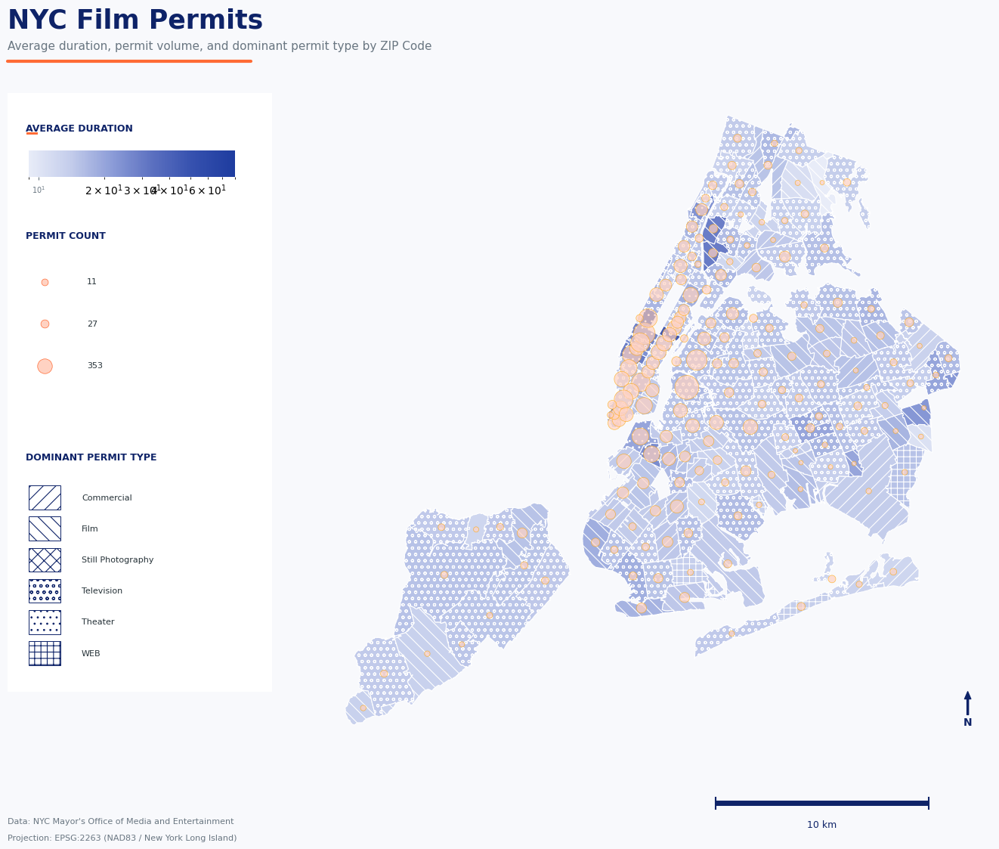

In [23]:
# ============================================================
# SETTINGS
# ============================================================

pd.set_option("display.max_columns", None)

# ------------------------------------------------------------
# Color palette
# ------------------------------------------------------------

BLUE = "#1E3C9F"
NAVY = "#0E2368"
ORANGE = "#FF6B35"
ORANGE_LIGHT = "#FFD2C2"

BACKGROUND = "#F8F9FC"
TEXT = "#263238"
TEXT_LIGHT = "#697681"
BORDER = "#D5DCE5"

# ============================================================
# DATA
# ============================================================

layer_data3 = map_data.dropna(
    subset=[
        "permits",
        "avg_duration_hours",
        "top_category",
    ]
).copy()

# Project to NY State Plane
gdf_proj = layer_data3.to_crs(2263)


# ============================================================
# AVERAGE DURATION
# ============================================================

duration = gdf_proj["avg_duration_hours"].to_numpy()

duration_normalizer = LogNorm(
    duration.min() + 1,
    duration.max(),
    clip=True,
)


# ------------------------------------------------------------
# Blue sequential color scale
#
# The darkest value is your requested #1E3C9F.
# ------------------------------------------------------------

duration_cmap = LinearSegmentedColormap.from_list(
    "duration_blue",
    [
        "#E8ECF8",
        "#C4CDEB",
        "#8D9DD8",
        "#5B70C0",
        "#3550AE",
        BLUE,
    ],
)


# ============================================================
# PERMIT COUNT
# ============================================================

permits = gdf_proj["permits"].to_numpy()


# ------------------------------------------------------------
# Marker size
#
# sqrt() makes marker AREA approximately proportional
# to permit count.
# ------------------------------------------------------------

permit_scale = np.sqrt(permits)

min_marker_size = 18
max_marker_size = 520

marker_sizes = min_marker_size + (
    (permit_scale - permit_scale.min()) / (permit_scale.max() - permit_scale.min())
) * (max_marker_size - min_marker_size)


# ============================================================
# HATCH PATTERNS
# ============================================================

category_hatches = {
    "Commercial": "//",
    "Film": "\\\\",
    "Still Photography": "xx",
    "Television": "oo",
    "Theater": "..",
    "WEB": "++",
}


# Orange hatch styling
plt.rcParams["hatch.color"] = ORANGE_LIGHT
plt.rcParams["hatch.linewidth"] = 0.8


# ============================================================
# FIGURE
# ============================================================

fig = plt.figure(
    figsize=(14, 12),
)

fig.patch.set_facecolor(BACKGROUND)


# ============================================================
# MAP
# ============================================================

ax = fig.add_axes([0.33, 0.12, 0.64, 0.76])

ax.set_facecolor(BACKGROUND)


# ------------------------------------------------------------
# Draw ZIP-code polygons
#
# Fill       = average duration
# Hatch      = dominant permit type
# Boundary   = neutral white
# ------------------------------------------------------------

for _, row in gdf_proj.iterrows():

    # Average duration → blue fill
    face_color = duration_cmap(duration_normalizer(row["avg_duration_hours"]))

    # Dominant permit type → orange hatch
    hatch = category_hatches.get(
        row["top_category"],
        "",
    )

    gpd.GeoSeries(
        [row.geometry],
        crs=gdf_proj.crs,
    ).plot(
        ax=ax,
        facecolor=face_color,
        edgecolor="white",
        linewidth=0.8,
        hatch=hatch,
        zorder=2,
    )


# ------------------------------------------------------------
# Permit count → proportional circles
# ------------------------------------------------------------

centroids = gdf_proj.geometry.centroid

ax.scatter(
    centroids.x,
    centroids.y,
    s=marker_sizes,
    facecolor=ORANGE_LIGHT,
    edgecolor="ORANGE",
    linewidth=0.5,
    alpha=0.7,
    zorder=5,
)


ax.set_axis_off()
ax.set_aspect("equal")


# ============================================================
# TITLE
# ============================================================

fig.text(
    0.04,
    0.955,
    "NYC Film Permits",
    fontsize=25,
    fontweight="bold",
    color=NAVY,
    va="top",
)

fig.text(
    0.04,
    0.918,
    "Average duration, permit volume, and dominant permit type by ZIP Code",
    fontsize=11,
    color=TEXT_LIGHT,
    va="top",
)


# Orange accent line
fig.add_artist(
    plt.Line2D(
        [0.04, 0.27],
        [0.895, 0.895],
        transform=fig.transFigure,
        color=ORANGE,
        linewidth=3,
        solid_capstyle="round",
    )
)


# ============================================================
# LEGEND PANEL
# ============================================================

legend_ax = fig.add_axes([0.04, 0.20, 0.25, 0.66])

legend_ax.set_xlim(
    0,
    1,
)

legend_ax.set_ylim(
    0,
    1,
)

legend_ax.axis("off")


# ------------------------------------------------------------
# Legend background
# ------------------------------------------------------------

legend_ax.add_patch(
    mpatches.FancyBboxPatch(
        (0, 0),
        1,
        1,
        boxstyle=("round,pad=0.012," "rounding_size=0.02"),
        transform=legend_ax.transAxes,
        facecolor="white",
        edgecolor=BORDER,
        linewidth=1.2,
    )
)


section_gap = 0.075
item_gap = 0.052

y = 0.95


# ============================================================
# LEGEND — AVERAGE DURATION
# ============================================================

legend_ax.text(
    0.07,
    y,
    "AVERAGE DURATION",
    fontsize=9,
    fontweight="bold",
    color=NAVY,
    va="top",
)


# Orange accent
legend_ax.add_patch(
    mpatches.Rectangle(
        (0.07, y - 0.019),
        0.045,
        0.004,
        transform=legend_ax.transAxes,
        facecolor=ORANGE,
        edgecolor="none",
    )
)


# Colorbar
cbar_ax = legend_ax.inset_axes([0.08, 0.86, 0.78, 0.045])


sm = ScalarMappable(
    norm=duration_normalizer,
    cmap=duration_cmap,
)

cbar = plt.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal",
)

cbar.outline.set_visible(False)

cbar.ax.tick_params(
    labelsize=7,
    colors=TEXT_LIGHT,
    length=3,
)


# ============================================================
# LEGEND — PERMIT COUNT
# ============================================================

y = 0.77

legend_ax.text(
    0.07,
    y,
    "PERMIT COUNT",
    fontsize=9,
    fontweight="bold",
    color=NAVY,
    va="top",
)


y -= 0.085


# ------------------------------------------------------------
# Permit-count legend circles
# ------------------------------------------------------------

count_breaks = np.percentile(
    permits,
    [25, 50, 90],
).astype(int)


# Use the same sqrt transformation as the map
break_sizes = np.sqrt(count_breaks)

break_marker_sizes = min_marker_size + (
    (break_sizes - permit_scale.min()) / (permit_scale.max() - permit_scale.min())
) * (max_marker_size - min_marker_size)


for value, marker_size in zip(
    count_breaks,
    break_marker_sizes,
):

    # matplotlib scatter uses points^2
    legend_ax.scatter(
        0.14,
        y,
        s=marker_size,
        facecolor=ORANGE_LIGHT,
        edgecolor=ORANGE,
        linewidth=0.5,
        zorder=5,
    )

    legend_ax.text(
        0.30,
        y,
        f"{value:,}",
        fontsize=8,
        color=TEXT,
        va="center",
    )

    y -= 0.07


# ============================================================
# LEGEND — DOMINANT PERMIT TYPE
# ============================================================

y -= section_gap


legend_ax.text(
    0.07,
    y,
    "DOMINANT PERMIT TYPE",
    fontsize=9,
    fontweight="bold",
    color=NAVY,
    va="top",
)


y -= 0.075


for category, hatch in category_hatches.items():

    legend_ax.add_patch(
        mpatches.Rectangle(
            (0.08, y - 0.02),
            0.12,
            0.04,
            facecolor="white",
            edgecolor=NAVY,
            linewidth=0.7,
            hatch=hatch,
        )
    )

    legend_ax.text(
        0.28,
        y,
        category,
        fontsize=8,
        color=TEXT,
        va="center",
    )

    y -= item_gap


# ============================================================
# NORTH ARROW
# ============================================================

ax.annotate(
    "N",
    xy=(0.965, 0.095),
    xytext=(0.965, 0.045),
    xycoords="axes fraction",
    textcoords="axes fraction",
    ha="center",
    fontsize=10,
    fontweight="bold",
    color=NAVY,
    arrowprops=dict(
        facecolor=NAVY,
        edgecolor=NAVY,
        width=1.5,
        headwidth=6,
        headlength=7,
        shrink=0,
    ),
)


# ============================================================
# SCALE BAR
# ============================================================

scale_ax = fig.add_axes([0.69, 0.05, 0.24, 0.05])

scale_ax.set_xlim(
    0,
    1,
)

scale_ax.set_ylim(
    0,
    1,
)

scale_ax.axis("off")


# Main scale bar
scale_ax.plot(
    [0.08, 0.92],
    [0.55, 0.55],
    color=NAVY,
    linewidth=5,
    solid_capstyle="butt",
)


# End ticks
scale_ax.plot(
    [0.08, 0.08],
    [0.42, 0.68],
    color=NAVY,
    linewidth=1.5,
)

scale_ax.plot(
    [0.92, 0.92],
    [0.42, 0.68],
    color=NAVY,
    linewidth=1.5,
)


scale_ax.text(
    0.50,
    0.02,
    "10 km",
    ha="center",
    fontsize=9,
    color=NAVY,
)


# ============================================================
# FOOTER
# ============================================================

fig.text(
    0.04,
    0.055,
    "Data: NYC Mayor's Office of Media and Entertainment",
    fontsize=8,
    color=TEXT_LIGHT,
)

fig.text(
    0.04,
    0.037,
    "Projection: EPSG:2263 (NAD83 / New York Long Island)",
    fontsize=8,
    color=TEXT_LIGHT,
)


# ============================================================
# SAVE
# ============================================================

plt.savefig(
    "nyc_permits_map.png",
    dpi=300,
    bbox_inches="tight",
    facecolor=BACKGROUND,
)


plt.show()

## 13. Summary — what this data can and can't tell us

**What we could get from data:**
- Where filming activity concentrates in NYC, at ZIP-code resolution
- Roughly how disruptive that activity tends to be, via duration
- What kind of production is most common in a given area

**What we couldn't get and why:**
- **Not a measure of impact or disruption on residents.** A permit doesn't capture street closures, noise complaints, parking loss, or crew size — a "Shooting" and a "Rigging" permit for the same production look identical in this count.
- **ZIP-level counts double-count multi-ZIP permits**, since a permit spanning several ZIPs is counted once in each — the map slightly overstates total activity in areas that border high-permit ZIPs.
- **MODZCTA boundaries exclude ~5–6% of ZIP-tagged records** that don't match this boundary file's crosswalk — the true picture in a few edge-case ZIPs (e.g. newer Brooklyn ZIPs like 11249/11251) is invisible here.
- **Average duration is sensitive to outliers** in low-count ZIPs, since the underlying distribution is right-skewed (most permits are ~1 day, a few run for weeks).
- **"Dominant category" hides the runner-up(s)** — two very differently-mixed ZIPs can show the same top category.
- **No population or business-density normalization** — a ZIP with 500 permits and 50,000 residents is a very different story from one with 500 permits and 2,000 residents, and this dataset alone can't distinguish them (would need to join Census population data, similar to the tutorial's population-density approach, to normalize per-capita).

These caveats point toward natural next steps: normalizing by population or land area, using median instead of mean duration, or joining in Community Board / business-improvement-district boundaries for a finer look at where filming activity actually falls.

## 14. Exercise - An Interactive 3D Map With Multiple Layers of Information (with help from AI)

Here, I tried to get help from AI to visualize several layers of information extracted from the data into a single interactive map.
Three datas are this:
- Number of permits by ZIP as extrusion height(elevation)
- Average Permit Duration by ZIP as color scheme
- Dominant Permit Category by ZIP as colored dot wih separate color legend

In [24]:
layer_data3 = map_data.dropna(
    subset=["permits", "avg_duration_hours", "top_category"]
).copy()
# layer 1: extruded polygons — height = permit count, color = avg duration
elevation3 = layer_data3["permits"].to_numpy()
elevation3_scaled = elevation3 / elevation3.max() * 3000
duration3 = layer_data3["avg_duration_hours"].to_numpy()
normalizer3 = LogNorm(duration3.min() + 1, duration3.max(), clip=True)
poly_colors3 = apply_continuous_cmap(normalizer3(duration3), Blues_9)
poly_layer3 = PolygonLayer.from_geopandas(
    gdf=layer_data3[
        ["modzcta", "permits", "avg_duration_hours", "top_category", "geometry"]
    ],
    extruded=True,
    get_elevation=elevation3_scaled,
    get_fill_color=poly_colors3,
    wireframe=True,
    opacity=0.75,
)
# layer 2: a colored dot at each ZIP's centroid — color = dominant category
category_colors = {
    "Commercial": (31, 119, 180, 255),
    "Film": (44, 160, 44, 255),
    "Still Photography": (148, 103, 189, 255),
    "Television": (227, 119, 194, 255),
    "Theater": (188, 189, 34, 255),
    "WEB": (23, 190, 207, 255),
}
# project to a metric CRS to get accurate centroids, then back to lon/lat
centroids = layer_data3.to_crs(2263).geometry.centroid.to_crs(4326)
points = gpd.GeoDataFrame(
    {"modzcta": layer_data3["modzcta"], "top_category": layer_data3["top_category"]},
    geometry=centroids,
    crs="EPSG:4326",
)
dot_colors = np.array(
    [category_colors.get(c, (128, 128, 128, 255)) for c in points["top_category"]],
    dtype="uint8",
)
scatter_layer = ScatterplotLayer.from_geopandas(
    gdf=points,
    get_fill_color=dot_colors,
    get_radius=120,
    radius_min_pixels=4,
    get_line_color=[255, 255, 255, 255],
    line_width_min_pixels=1,
)
view_state3 = {
    "longitude": -73.9776,
    "latitude": 40.7614,
    "zoom": 10.3,
    "pitch": 55,
    "bearing": 0,
}
m3 = Map([poly_layer3, scatter_layer], view_state=view_state3)
m3